In [312]:
#Import the libraries
import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

import matplotlib.patches as mpatches
%matplotlib inline
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score
from IPython.display import display

In [65]:
#dataset = pd.read_excel("E Commerce Dataset.xlsx","E Comm")
# data = pd.read_csv('file.csv', engine='python', delimiter=';', decimal = ',') 
#If I want to not manually fix the code along the way how should I write as the file name and code shown above?
#dataset = pd.read_csv("E Commerce Dataset.csv","E Comm", engine='python', delimiter=';', decimal=',')

In [291]:
data = pd.read_csv('E Commerce Dataset.csv', engine='python', delimiter=';', decimal = ',') 

FileNotFoundError: [Errno 2] No such file or directory: 'E Commerce Dataset.csv'

In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5630 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5630 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5630 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

In [349]:
df.groupby('Churn').size()

Churn
0    4682
1     948
dtype: int64

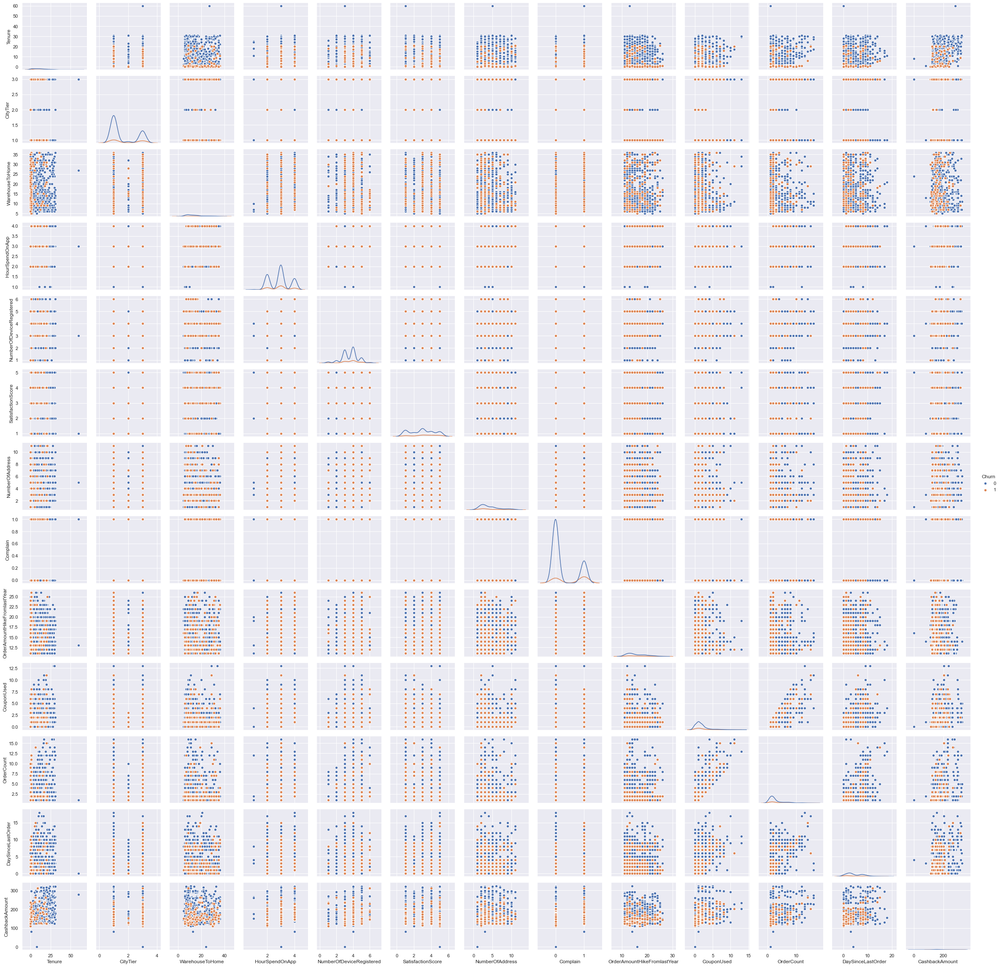

In [275]:
#numeric_dataset = pd.concat([numeric_dataset,dataset["Churn"]],axis=1) # Add the 'Churn' variable to the numeric dataset
g = sns.PairGrid(dataset.sample(n=1000), hue="Churn")
g = g.map_offdiag(plt.scatter, linewidths=1, edgecolor="w", s=40)
g = g.map_diag(sns.kdeplot)
g = g.add_legend()

In [350]:
df.head().T #Transposed for easier visualization

,0,1,2,3,4
CustomerID,55535,52720,53744,50929,52848
Churn,0,0,0,0,0
Tenure,61.0,60.0,51.0,50.0,31.0
PreferredLoginDevice,Mobile Phone,Mobile Phone,Mobile Phone,Phone,Mobile Phone
CityTier,3,3,1,1,1
WarehouseToHome,28.0,27.0,7.0,6.0,16.0
PreferredPaymentMode,Debit Card,Debit Card,Debit Card,Debit Card,Credit Card
Gender,Female,Female,Male,Male,Female
HourSpendOnApp,4.0,3.0,4.0,3.0,4.0
NumberOfDeviceRegistered,4,3,2,1,5


In [351]:
#Show all of the columns
df.columns.values

array(['CustomerID', 'Churn', 'Tenure', 'PreferredLoginDevice',
       'CityTier', 'WarehouseToHome', 'PreferredPaymentMode', 'Gender',
       'HourSpendOnApp', 'NumberOfDeviceRegistered', 'PreferedOrderCat',
       'SatisfactionScore', 'MaritalStatus', 'NumberOfAddress',
       'Complain', 'OrderAmountHikeFromlastYear', 'CouponUsed',
       'OrderCount', 'DaySinceLastOrder', 'CashbackAmount'], dtype=object)

In [355]:
sns.violinplot(x="Churn", y="tenure", data=df); #?

ValueError: Could not interpret input 'tenure'

In [263]:
dataset.head()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,0,61.0,Mobile Phone,3,28.0,Debit Card,Female,4.0,4,Grocery,1,Married,6,1,NaN,1.0,2.0,1.0,303.75
1,0,60.0,Mobile Phone,3,27.0,Debit Card,Female,3.0,3,Grocery,1,Married,5,1,13.0,NaN,1.0,0.0,278.75
2,0,51.0,Mobile Phone,1,7.0,Debit Card,Male,4.0,2,Laptop & Accessory,3,Divorced,2,0,25.0,2.0,3.0,9.0,174.00
3,0,50.0,Phone,1,6.0,Debit Card,Male,3.0,1,Laptop & Accessory,3,Divorced,1,0,24.0,1.0,2.0,8.0,149.00
4,0,31.0,Mobile Phone,1,16.0,Credit Card,Female,4.0,5,Mobile Phone,4,Divorced,6,1,21.0,2.0,2.0,1.0,158.46


In [97]:
#Show the number of column and rows
dataset.shape

(5630, 20)

In [100]:
#Check for missing or na values
df.isna().sum()

CustomerID                     0
Churn                          0
Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferedOrderCat               0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

In [357]:
dataset.isna()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5626,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5627,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5628,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [101]:
# Show some statistics
df.describe()

,CustomerID,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
count,5630.000000,5630.000000,5630.000000,5630.000000,5630.000000,5630.000000,5630.000000,5630.000000,5630.000000,5630.000000,5630.000000,5630.000000,5630.000000,5630.000000,5630.000000
mean,52815.500000,0.168384,10.189899,1.654707,15.639896,2.931535,3.688988,3.066785,4.214032,0.284902,15.707922,1.751023,3.008004,4.543491,177.223030
std,1625.385339,0.374240,8.354164,0.915389,8.339095,0.705384,1.023999,1.380194,2.583586,0.451408,3.587926,1.851038,2.871521,3.553382,49.207036
min,50001.000000,0.000000,0.000000,1.000000,5.000000,0.000000,1.000000,1.000000,1.000000,0.000000,11.000000,0.000000,1.000000,0.000000,0.000000
25%,51408.250000,0.000000,3.000000,1.000000,9.000000,2.000000,3.000000,2.000000,2.000000,0.000000,13.000000,1.000000,1.000000,2.000000,145.770000
50%,52815.500000,0.000000,9.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.000000,0.000000,15.000000,1.000000,2.000000,4.000000,163.280000
75%,54222.750000,0.000000,15.000000,3.000000,20.000000,3.000000,4.000000,4.000000,6.000000,1.000000,18.000000,2.000000,3.008004,7.000000,196.392500
max,55630.000000,1.000000,61.000000,3.000000,127.000000,5.000000,6.000000,5.000000,22.000000,1.000000,26.000000,16.000000,16.000000,46.000000,324.990000


In [104]:
#Get customer churn count
dataset['Churn'].value_counts()

0    4682
1     948
Name: Churn, dtype: int64

C:\Users\user\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Churn', ylabel='count'>

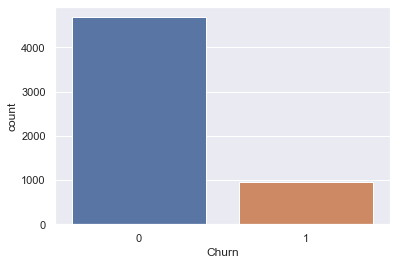

In [262]:
#Visualize the count of customer churn
sns.countplot(df['Churn'])

In [107]:
#What is the percentage of customers that are leaving?
num_retained = dataset[dataset.Churn == 0].shape[0]
num_churned = dataset[dataset.Churn== 1].shape[0]

#Print the percentage of customer that stayed
print(num_retained / (num_retained + num_churned) * 100, '% of customers stayed with the company.')

#Print the percentage of customer that left
print(num_churned / (num_retained + num_churned) * 100, '% of customers left with the company.')


83.16163410301954 % of customers stayed with the company.
16.838365896980463 % of customers left with the company.


<AxesSubplot:xlabel='Gender', ylabel='count'>

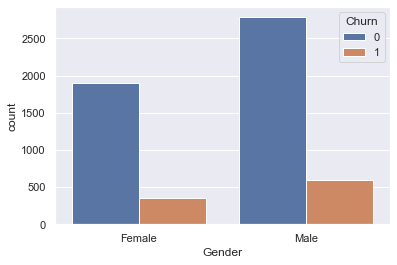

In [207]:
#Visualize the churn count for both males and females
sns.countplot(x='Gender', hue='Churn',data = dataset)

<AxesSubplot:xlabel='HourSpendOnApp', ylabel='count'>

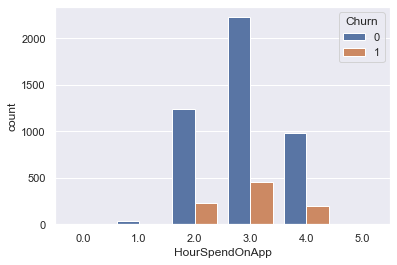

In [206]:
#Visualize the churn count for the HourSpendOnApp 
sns.countplot(x='HourSpendOnApp', hue='Churn', data = dataset)

array([<AxesSubplot:title={'center':'Tenure'}>,
       <AxesSubplot:title={'center':'Churn'}>], dtype=object)

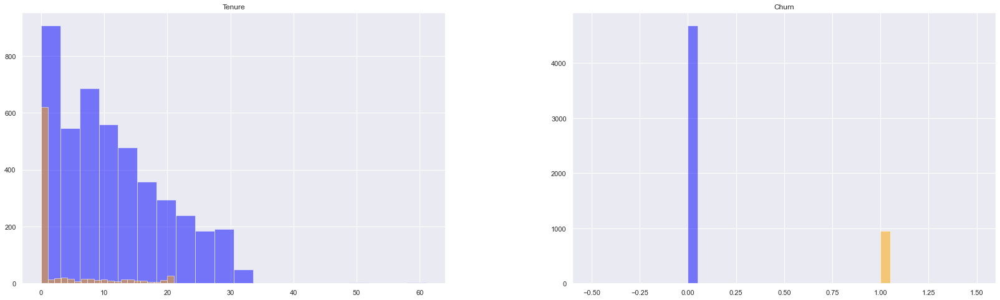

In [246]:
#th
numerical_features = ['Tenure', 'Churn']
fig, ax = plt.subplots(1, 2, figsize=(28,8))
dataset[dataset.Churn == 0][numerical_features].hist(bins=20, color='blue', alpha=0.5, ax = ax)
dataset[dataset.Churn == 1][numerical_features].hist(bins=20, color='orange', alpha=0.5, ax = ax)

In [277]:
#Remove unnecessary columns
clean_dataset = dataset.drop('customerID', axis = 1)

KeyError: "['customerID'] not found in axis"

In [249]:
#Look at the number of rows and cols in the dataset
clean_dataset.shape

(5630, 19)

In [295]:
#Convert all of the non-numeric columns to numeric  (pd.to_numeric(ser, downcast ='signed') if clean_dataset[column].dtype == np.number :
for column in clean_dataset.columns:
    if pd.api.types.is_numeric_dtype(clean_dataset[column]):
        continue
    clean_dataset[column] = LabelEncoder().fit_transform(clean_dataset[column])

In [348]:
clean_dataset.isna()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5626,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5627,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5628,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [282]:
#Show the new data set data types
clean_dataset.dtypes

Churn                            int64
Tenure                         float64
PreferredLoginDevice             int64
CityTier                         int64
WarehouseToHome                float64
PreferredPaymentMode             int64
Gender                           int64
HourSpendOnApp                 float64
NumberOfDeviceRegistered         int64
PreferedOrderCat                 int64
SatisfactionScore                int64
MaritalStatus                    int64
NumberOfAddress                  int64
Complain                         int64
OrderAmountHikeFromlastYear    float64
CouponUsed                     float64
OrderCount                     float64
DaySinceLastOrder              float64
CashbackAmount                 float64
dtype: object

In [255]:
#Show the first 5 rows of the new data set
clean_df.head()

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,0,61.0,Mobile Phone,3,28.0,Debit Card,Female,4.0,4,Grocery,1,Married,6,1,15.707922,1.000000,2.0,1.0,303.75
1,0,60.0,Mobile Phone,3,27.0,Debit Card,Female,3.0,3,Grocery,1,Married,5,1,13.000000,1.751023,1.0,0.0,278.75
2,0,51.0,Mobile Phone,1,7.0,Debit Card,Male,4.0,2,Laptop & Accessory,3,Divorced,2,0,25.000000,2.000000,3.0,9.0,174.00
3,0,50.0,Phone,1,6.0,Debit Card,Male,3.0,1,Laptop & Accessory,3,Divorced,1,0,24.000000,1.000000,2.0,8.0,149.00
4,0,31.0,Mobile Phone,1,16.0,Credit Card,Female,4.0,5,Mobile Phone,4,Divorced,6,1,21.000000,2.000000,2.0,1.0,158.46


In [304]:
#Scaled the data
x = clean_dataset.drop('Churn', axis = 1) #Feature data set
y = clean_dataset['Churn']

x = StandardScaler().fit_transform(x)

In [332]:
#Split the data into 80% traning and 20% testing
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state = 42)

In [333]:
#Create the model
model = LogisticRegression()

#Train the model
model.fit(x_train, y_train)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [341]:
x_train[0]
np.any(np.isnan(x_train))


True

In [340]:
y_train[0]

0

In [345]:
df.isna().sum()

CustomerID                     0
Churn                          0
Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferedOrderCat               0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

In [310]:
#Create the predictions on the test data
predictions = model.predict(x_test)

#print the predictions
print(predictions)

NotFittedError: This LogisticRegression instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

In [ ]:
#Check the precision, recall, f1-score
print(classification_report(y_test, prediction))

In [271]:
clean_dataset = dataset.drop('customerID', axis = 1)
#Look at the number of rows and cols in the data set
clean_dataset.shape

KeyError: "['customerID'] not found in axis"

In [34]:
dataset.shape

(5630, 20)

In [33]:
dataset.fillna(dataset.mean())

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,55535,0,61.000000,Mobile Phone,3,28.0,Debit Card,Female,4.0,4,Grocery,1,Married,6,1,15.707922,1.000000,2.0,1.0,303.75
1,52720,0,60.000000,Mobile Phone,3,27.0,Debit Card,Female,3.0,3,Grocery,1,Married,5,1,13.000000,1.751023,1.0,0.0,278.75
2,53744,0,51.000000,Mobile Phone,1,7.0,Debit Card,Male,4.0,2,Laptop & Accessory,3,Divorced,2,0,25.000000,2.000000,3.0,9.0,174.00
3,50929,0,50.000000,Phone,1,6.0,Debit Card,Male,3.0,1,Laptop & Accessory,3,Divorced,1,0,24.000000,1.000000,2.0,8.0,149.00
4,52848,0,31.000000,Mobile Phone,1,16.0,Credit Card,Female,4.0,5,Mobile Phone,4,Divorced,6,1,21.000000,2.000000,2.0,1.0,158.46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,52757,0,10.189899,Phone,2,8.0,UPI,Female,2.0,3,Mobile,4,Married,5,0,14.000000,0.000000,1.0,2.0,121.87
5626,52761,0,10.189899,Computer,1,7.0,CC,Male,2.0,4,Mobile,3,Married,2,0,12.000000,0.000000,1.0,0.0,120.08
5627,52774,0,10.189899,Phone,3,7.0,CC,Male,3.0,4,Mobile,4,Married,1,0,14.000000,2.000000,2.0,2.0,122.69
5628,52784,1,10.189899,Computer,3,15.0,E wallet,Male,2.0,3,Mobile Phone,5,Married,2,0,19.000000,1.000000,1.0,0.0,117.90


In [ ]:
dataset.fillna(dataset.mean())
dataset.isnull().sum()

In [38]:
dataset.mean()

CustomerID                     52815.500000
Churn                              0.168384
Tenure                            10.189899
CityTier                           1.654707
WarehouseToHome                   15.639896
HourSpendOnApp                     2.931535
NumberOfDeviceRegistered           3.688988
SatisfactionScore                  3.066785
NumberOfAddress                    4.214032
Complain                           0.284902
OrderAmountHikeFromlastYear       15.707922
CouponUsed                         1.751023
OrderCount                         3.008004
DaySinceLastOrder                  4.543491
CashbackAmount                   177.223030
dtype: float64

In [ ]:
#Find % of missing data in each column
for col in dataset.columns:
    pct_missing = np.mean(dataset[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

In [ ]:
dataset["PreferredLoginDevice"].unique()

In [39]:
dataset.mode()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,0.0,1.0,Mobile Phone,1.0,9.0,Debit Card,Male,3.0,4.0,Laptop & Accessory,3.0,Married,2.0,0.0,14.0,1.0,2.0,3.0,123.42
1,50002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,148.42
2,50003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,149.36
3,50004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,50005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5625,55626,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5626,55627,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5627,55628,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5628,55629,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
dataset.describe()

,CustomerID,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
count,5630.000000,5630.000000,5366.000000,5630.000000,5379.000000,5375.000000,5630.000000,5630.000000,5630.000000,5630.000000,5365.000000,5374.000000,5372.000000,5323.000000,5630.000000
mean,52815.500000,0.168384,10.189899,1.654707,15.639896,2.931535,3.688988,3.066785,4.214032,0.284902,15.707922,1.751023,3.008004,4.543491,177.223030
std,1625.385339,0.374240,8.557241,0.915389,8.531475,0.721926,1.023999,1.380194,2.583586,0.451408,3.675485,1.894621,2.939680,3.654433,49.207036
min,50001.000000,0.000000,0.000000,1.000000,5.000000,0.000000,1.000000,1.000000,1.000000,0.000000,11.000000,0.000000,1.000000,0.000000,0.000000
25%,51408.250000,0.000000,2.000000,1.000000,9.000000,2.000000,3.000000,2.000000,2.000000,0.000000,13.000000,1.000000,1.000000,2.000000,145.770000
50%,52815.500000,0.000000,9.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.000000,0.000000,15.000000,1.000000,2.000000,3.000000,163.280000
75%,54222.750000,0.000000,16.000000,3.000000,20.000000,3.000000,4.000000,4.000000,6.000000,1.000000,18.000000,2.000000,3.000000,7.000000,196.392500
max,55630.000000,1.000000,61.000000,3.000000,127.000000,5.000000,6.000000,5.000000,22.000000,1.000000,26.000000,16.000000,16.000000,46.000000,324.990000


In [29]:
# function to get unique values of all 'object' columns only
for col in list(dataset):
    print(col)
    print(dataset[col].unique())

CustomerID
[55535 52720 53744 ... 52774 52784 52803]
Churn
[0 1]
Tenure
[61. 60. 51. 50. 31. 30. 29. 28. 27. 26. 25. 24. 23. 22. 21. 20. 19. 18.
 17. 16. 15. 14. 13. 12. 11. 10.  9.  8.  7.  6.  5.  4.  3.  2.  1.  0.
 nan]
PreferredLoginDevice
['Mobile Phone' 'Phone' 'Computer']
CityTier
[3 1 2]
WarehouseToHome
[ 28.  27.   7.   6.  16.  31.  10.  13.  14.  36.  35.  23.  12.   9.
  25.  30.  22.  32.  17.   8.  15.  34.  11.  24.  nan  21.  18.  29.
  33.  20.  26.   5.  19. 127. 126.]
PreferredPaymentMode
['Debit Card' 'Credit Card' 'E wallet' 'Cash on Delivery' 'UPI' 'CC' 'COD']
Gender
['Female' 'Male']
HourSpendOnApp
[ 4.  3.  5.  2. nan  1.  0.]
NumberOfDeviceRegistered
[4 3 2 1 5 6]
PreferedOrderCat
['Grocery' 'Laptop & Accessory' 'Mobile Phone' 'Fashion' 'Others' 'Mobile']
SatisfactionScore
[1 3 4 2 5]
MaritalStatus
['Married' 'Divorced' 'Single']
NumberOfAddress
[ 6  5  2  1 10  4  7  8  3  9 11 22 21 20 19]
Complain
[1 0]
OrderAmountHikeFromlastYear
[nan 13. 25. 24. 21. 17. 1

In [184]:
df.isnull().sum()

CustomerID                     0
Churn                          0
Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferedOrderCat               0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

In [27]:
def missing_cols(df):
    '''prints out columns with its amount of missing values'''
    total = 0
    for col in df.columns:
        missing_vals = df[col].isnull().sum()
        total += missing_vals
        if missing_vals != 0:
            print(f"{col} => {df[col].isnull().sum()}")
    
    if total == 0:
        print("no missing values left")
            
missing_cols(dataset)

Tenure => 264
WarehouseToHome => 251
HourSpendOnApp => 255
OrderAmountHikeFromlastYear => 265
CouponUsed => 256
OrderCount => 258
DaySinceLastOrder => 307


In [26]:
plt.figure(figsize=(10, 6))
sns.heatmap(dataset.isnull(), yticklabels=False, cmap='viridis', cbar=False)

<AxesSubplot:>

In [25]:
plt.figure(figsize=(10, 6))
dataset['PreferedOrderCat'].value_counts().plot.bar()

<AxesSubplot:>

In [24]:
cat_df = dataset.select_dtypes(include=['object'])
for col in list(cat_df):
    print(col)
    print(cat_df[col].unique())

PreferredLoginDevice
['Mobile Phone' 'Phone' 'Computer']
PreferredPaymentMode
['Debit Card' 'Credit Card' 'E wallet' 'Cash on Delivery' 'UPI' 'CC' 'COD']
Gender
['Female' 'Male']
PreferedOrderCat
['Grocery' 'Laptop & Accessory' 'Mobile Phone' 'Fashion' 'Others' 'Mobile']
MaritalStatus
['Married' 'Divorced' 'Single']


In [23]:
dataset.info

<bound method DataFrame.info of       CustomerID  Churn  Tenure PreferredLoginDevice  CityTier  \
0          55535      0    61.0         Mobile Phone         3   
1          52720      0    60.0         Mobile Phone         3   
2          53744      0    51.0         Mobile Phone         1   
3          50929      0    50.0                Phone         1   
4          52848      0    31.0         Mobile Phone         1   
...          ...    ...     ...                  ...       ...   
5625       52757      0     NaN                Phone         2   
5626       52761      0     NaN             Computer         1   
5627       52774      0     NaN                Phone         3   
5628       52784      1     NaN             Computer         3   
5629       52803      0     NaN         Mobile Phone         1   

      WarehouseToHome PreferredPaymentMode  Gender  HourSpendOnApp  \
0                28.0           Debit Card  Female             4.0   
1                27.0           Deb

In [ ]:
dataset.dtypes

In [ ]:
df.isnull().sum()

In [ ]:
dataset['Gender'].unique()

In [ ]:
dataset.isnull()

In [ ]:
g = pd.DataFrame(dataset)

In [ ]:
g.fillna(0)

In [ ]:
g.isnull().sum().reset_index(name="n").plot.bar(x="index", y="n", rot=45)

In [354]:
# Handling with "Missing" Values
import pandas as pd

df = pd.read_excel("E Commerce Dataset.xlsx","E Comm")

df = pd.DataFrame(dataset)

df = df.fillna(dataset.mean())

df.isnull().sum()

CustomerID                     0
Churn                          0
Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferedOrderCat               0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

In [20]:
df.tail()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
5625,52757,0,10.189899,Phone,2,8.0,UPI,Female,2.0,3,Mobile,4,Married,5,0,14.0,0.0,1.0,2.0,121.87
5626,52761,0,10.189899,Computer,1,7.0,CC,Male,2.0,4,Mobile,3,Married,2,0,12.0,0.0,1.0,0.0,120.08
5627,52774,0,10.189899,Phone,3,7.0,CC,Male,3.0,4,Mobile,4,Married,1,0,14.0,2.0,2.0,2.0,122.69
5628,52784,1,10.189899,Computer,3,15.0,E wallet,Male,2.0,3,Mobile Phone,5,Married,2,0,19.0,1.0,1.0,0.0,117.90
5629,52803,0,10.189899,Mobile Phone,1,8.0,CC,Female,3.0,3,Mobile,3,Married,3,0,14.0,0.0,1.0,2.0,120.01


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5630 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5630 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5630 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

In [41]:
df.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,55535,0,61.0,Mobile Phone,3,28.0,Debit Card,Female,4.0,4,Grocery,1,Married,6,1,15.707922,1.000000,2.0,1.0,303.75
1,52720,0,60.0,Mobile Phone,3,27.0,Debit Card,Female,3.0,3,Grocery,1,Married,5,1,13.000000,1.751023,1.0,0.0,278.75
2,53744,0,51.0,Mobile Phone,1,7.0,Debit Card,Male,4.0,2,Laptop & Accessory,3,Divorced,2,0,25.000000,2.000000,3.0,9.0,174.00
3,50929,0,50.0,Phone,1,6.0,Debit Card,Male,3.0,1,Laptop & Accessory,3,Divorced,1,0,24.000000,1.000000,2.0,8.0,149.00
4,52848,0,31.0,Mobile Phone,1,16.0,Credit Card,Female,4.0,5,Mobile Phone,4,Divorced,6,1,21.000000,2.000000,2.0,1.0,158.46


In [42]:
df.tail()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
5625,52757,0,10.189899,Phone,2,8.0,UPI,Female,2.0,3,Mobile,4,Married,5,0,14.0,0.0,1.0,2.0,121.87
5626,52761,0,10.189899,Computer,1,7.0,CC,Male,2.0,4,Mobile,3,Married,2,0,12.0,0.0,1.0,0.0,120.08
5627,52774,0,10.189899,Phone,3,7.0,CC,Male,3.0,4,Mobile,4,Married,1,0,14.0,2.0,2.0,2.0,122.69
5628,52784,1,10.189899,Computer,3,15.0,E wallet,Male,2.0,3,Mobile Phone,5,Married,2,0,19.0,1.0,1.0,0.0,117.90
5629,52803,0,10.189899,Mobile Phone,1,8.0,CC,Female,3.0,3,Mobile,3,Married,3,0,14.0,0.0,1.0,2.0,120.01


In [335]:
pr(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [84]:
#Get customer churn count
dataset['Churn'].value_counts()

0    4682
1     948
Name: Churn, dtype: int64

In [289]:
dataset.dtypes

CustomerID                       int64
Churn                            int64
Tenure                         float64
PreferredLoginDevice            object
CityTier                         int64
WarehouseToHome                float64
PreferredPaymentMode            object
Gender                          object
HourSpendOnApp                 float64
NumberOfDeviceRegistered         int64
PreferedOrderCat                object
SatisfactionScore                int64
MaritalStatus                   object
NumberOfAddress                  int64
Complain                         int64
OrderAmountHikeFromlastYear    float64
CouponUsed                     float64
OrderCount                     float64
DaySinceLastOrder              float64
CashbackAmount                 float64
dtype: object